In [1]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
data_spotify = pd.read_csv("SpotifyAudioFeaturesApril2019.csv")
data_spotify.head()

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.118,15
1,YG,1tHDG53xJNGsItRA3vfVgs,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.371,0
2,R3HAB,6Wosx2euFPMT14UXiWudMy,Radio Silence,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.382,56
3,Chris Cooq,3J2Jpw61sO7l6Hc7qdYV91,Lactose,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.641,0
4,Chris Cooq,2jbYvQCyPgX3CdmAzeVeuS,Same - Original mix,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.928,0


In [4]:
data_spotify.isnull().sum()

artist_name         0
track_id            0
track_name          1
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
popularity          0
dtype: int64

In [5]:
data_spotify.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130663 entries, 0 to 130662
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist_name       130663 non-null  object 
 1   track_id          130663 non-null  object 
 2   track_name        130662 non-null  object 
 3   acousticness      130663 non-null  float64
 4   danceability      130663 non-null  float64
 5   duration_ms       130663 non-null  int64  
 6   energy            130663 non-null  float64
 7   instrumentalness  130663 non-null  float64
 8   key               130663 non-null  int64  
 9   liveness          130663 non-null  float64
 10  loudness          130663 non-null  float64
 11  mode              130663 non-null  int64  
 12  speechiness       130663 non-null  float64
 13  tempo             130663 non-null  float64
 14  time_signature    130663 non-null  int64  
 15  valence           130663 non-null  float64
 16  popularity        13

In [6]:
data_spotify['track_name'].fillna((data_spotify['track_name']).mode()[0], inplace = True)

In [7]:
data_spotify.isnull().sum()

artist_name         0
track_id            0
track_name          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
popularity          0
dtype: int64

In [8]:
label_encode = LabelEncoder()
for col in data_spotify.select_dtypes(include=['object']).columns:
    data_spotify[col] = label_encode.fit_transform(data_spotify[col])

In [9]:
data_spotify.head()

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
0,33019,40901,11379,0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.118,15
1,33019,31709,8509,0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.371,0
2,24457,109109,73461,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.382,56
3,5669,55372,50406,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.641,0
4,5669,45782,77531,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.928,0


<Axes: >

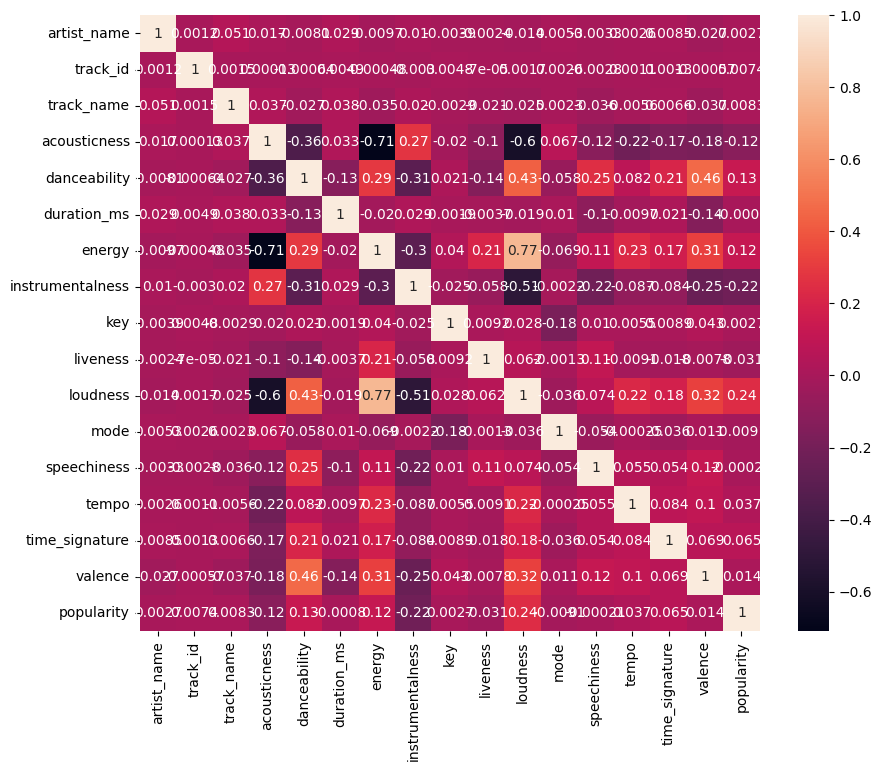

In [10]:
# Check for the correlations
correlation_matrix = data_spotify.corr()
plt.figure(figsize = (10,8))
sns.heatmap(correlation_matrix, annot = True)

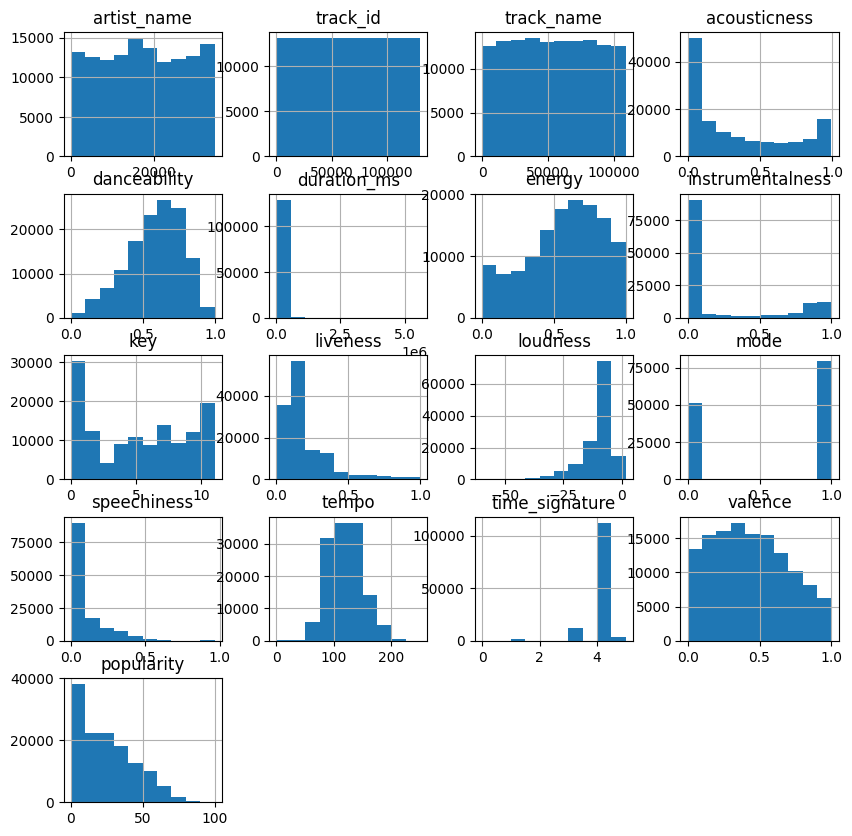

In [11]:
# Distributions for the dataset
data_spotify.hist(figsize = (10,10), bins = 10)
plt.title("Histogram for all columns", fontsize = 10)
plt.show()

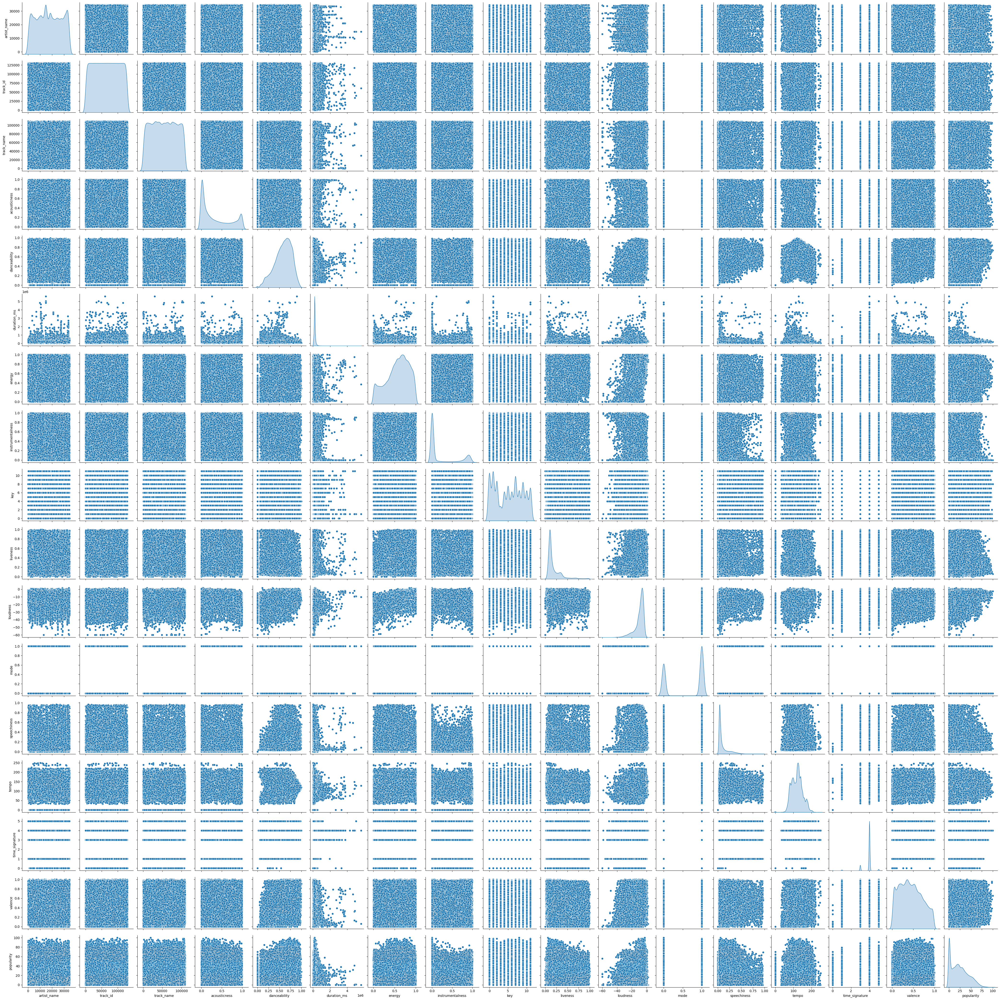

In [12]:
# Pairplots for the dataset
sns.pairplot(data_spotify, diag_kind='kde')
plt.show()

In [13]:
data_spotify.head()

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
0,33019,40901,11379,0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.118,15
1,33019,31709,8509,0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.371,0
2,24457,109109,73461,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.382,56
3,5669,55372,50406,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.641,0
4,5669,45782,77531,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.928,0


In [14]:
X = data_spotify[['track_id', 'track_name', 'popularity']]
X

,track_id,track_name,popularity
0,40901,11379,15
1,31709,8509,0
2,109109,73461,56
3,55372,50406,0
4,45782,77531,0
...,...,...,...
130658,10624,18875,57
130659,67838,29068,60
130660,74862,24700,47
130661,95449,63482,50


In [15]:
scaler = StandardScaler()
data_scaler = scaler.fit_transform(X)
data_scaler

array([[-0.64488701, -1.37893099, -0.46715031],
       [-0.88921137, -1.47112569, -1.22806504],
       [ 1.16808903,  0.61536586,  1.61268329],
       ...,
       [ 0.25780006, -0.95101262,  1.15613445],
       [ 0.80500475,  0.29480453,  1.3083174 ],
       [ 1.53282128, -0.8206872 ,  1.56195565]], shape=(130663, 3))

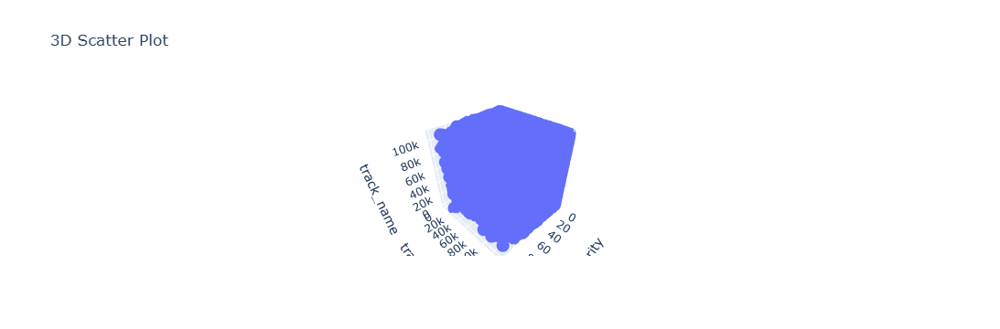

In [16]:
fig = px.scatter_3d(data_spotify, x = 'popularity', y = 'track_id', z = 'track_name', title = '3D Scatter Plot')
fig.show()

In [17]:
# Step2 (Find Covariance)
covariance_matrix = np.cov(X.T)
covariance_matrix

array([[1.41543465e+09, 1.71751053e+06, 5.48310609e+03],
       [1.71751053e+06, 9.69069935e+08, 5.10001744e+03],
       [5.48310609e+03, 5.10001744e+03, 3.88609895e+02]])

In [18]:
# Step3 (Find eignvalues)
eigen_values, eigen_vectors = np.linalg.eig(covariance_matrix)
eigen_values

array([1.41544126e+09, 9.69063326e+08, 3.88561885e+02])

In [19]:
eigen_vectors

array([[-9.99992598e-01, -3.84768859e-03, -3.86742013e-06],
       [-3.84768856e-03,  9.99992598e-01, -5.25594383e-06],
       [-3.88761473e-06,  5.24102429e-06,  1.00000000e+00]])

In [20]:
# Step4 (Select No of Principle Components)
principal_component = eigen_vectors[0:2]
principal_component

array([[-9.99992598e-01, -3.84768859e-03, -3.86742013e-06],
       [-3.84768856e-03,  9.99992598e-01, -5.25594383e-06]])

In [21]:
# Step5 (Transform Data 3D to 2D)
transformed_data = np.dot(data_scaler, principal_component.T)
data = pd.DataFrame(transformed_data, columns=['PC1', 'PC2'])
data

,PC1,PC2
0,0.650190,-1.376437
1,0.894870,-1.467687
2,-1.170454,0.610858
3,0.260731,-0.124235
4,0.512280,0.748092
...,...,...
130658,1.454015,-1.132555
130659,-0.067989,-0.810974
130660,-0.254143,-0.952004
130661,-0.806138,0.291698


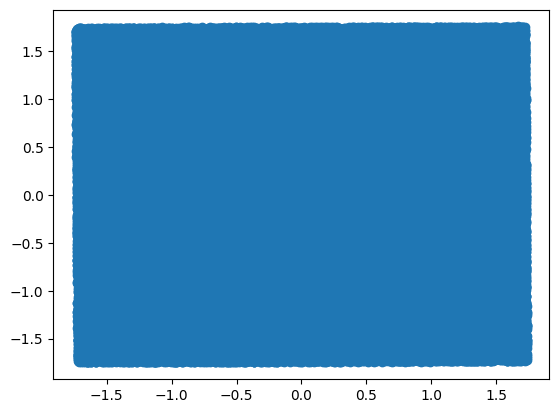

In [24]:
# Final 2D Plot
plt.scatter(data['PC1'], data['PC2'])
plt.show()